In [ ]:
import numpy as np
import pandas as pd
from sklearn.cluster import AgglomerativeClustering, KMeans, MeanShift
from sklearn.decomposition import PCA
from sklearn.metrics import make_scorer, silhouette_samples
from sklearn.mixture import GaussianMixture
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler

In [10]:
df = pd.read_csv("../datasets/cmyk_by_dpi_and_render_options.csv")
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 82212 entries, 0 to 82211
Data columns (total 11 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   converting_time      82212 non-null  float64
 1   page                 82212 non-null  int64  
 2   dpi                  82212 non-null  int64  
 3   c                    82212 non-null  float64
 4   m                    82212 non-null  float64
 5   y                    82212 non-null  float64
 6   k                    82212 non-null  float64
 7   sum                  82212 non-null  float64
 8   base_minus_curr_sum  82212 non-null  float64
 9   diff                 82212 non-null  float64
 10  options              82212 non-null  object 
dtypes: float64(8), int64(2), object(1)
memory usage: 6.9+ MB


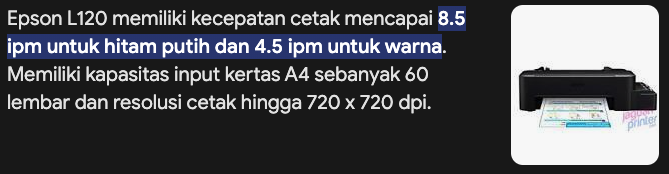


In [ ]:
df300 = df[(df["dpi"] == 300) & (df["options"] == "default")].copy()
df300.drop(
    columns=["options", "converting_time", "dpi", "base_minus_curr_sum"], inplace=True
)

# Transforms cmyk to 1.52x
df300["c"] = df300["c"] * (1 + (4.5 / 8.5))
df300["m"] = df300["m"] * (1 + (4.5 / 8.5))
df300["y"] = df300["y"] * (1 + (4.5 / 8.5))
df300["k"] = df300["k"] * (1 + (4.5 / 8.5))
df300["sum"] = df300["c"] + df300["m"] + df300["y"] + df300["k"]

df300.sample(10)

,page,c,m,y,k,sum,diff
235,236,4.144706,0.290588,11.975294,8.151765,24.562353,0.0
336,337,5.536471,0.474118,15.951765,11.684706,33.647059,0.0
23,24,0.000000,0.000000,0.000000,17.007059,17.007059,0.0
621,622,0.000000,0.000000,0.000000,0.091765,0.091765,0.0
173,174,3.349412,0.214118,9.405882,6.301176,19.270588,0.0
331,332,5.949412,0.397647,17.083529,11.164706,34.595294,0.0
550,551,0.550588,0.550588,1.544706,6.836471,9.482353,0.0
769,770,3.594118,0.260000,10.445882,7.188235,21.488235,0.0
862,863,3.961176,0.367059,10.889412,8.962353,24.180000,0.0
236,237,4.618824,0.443529,13.107059,10.736471,28.905882,0.0


In [ ]:
kmeans_grid_params = {
    "n_clusters": range(2, 11),
    "init": ["k-means++", "random"],
    "algorithm": ["lloyd", "elkan"],
    "n_init": ["auto"],
}

agglomerative = {
    "n_clusters": list(range(2, 11)),
    "metric": ["euclidean", "l1", "l2", "manhattan", "cosine", "precomputed"],
    "linkage": ["ward", "complete", "average", "single"],
}

kmeans = KMeans()

In [177]:
kmeans_grid_cv = GridSearchCV(kmeans, kmeans_grid_params, cv=3, verbose=2)

In [178]:
kmeans_grid_cv.param_grid

{'n_clusters': range(2, 11),
 'init': ['k-means++', 'random'],
 'algorithm': ['lloyd', 'elkan'],
 'n_init': ['auto']}

In [ ]:
scaler = StandardScaler()
X = scaler.fit_transform(df300[["c", "m", "y", "k", "sum"]].to_numpy())
X2 = scaler.fit_transform(df300[["sum"]].to_numpy())
X3 = scaler.fit_transform(df300[["k", "sum"]].to_numpy())

kmeans_grid_cv.fit(X)

Fitting 3 folds for each of 36 candidates, totalling 108 fits
[CV] END algorithm=lloyd, init=k-means++, n_clusters=2, n_init=auto; total time=   0.0s
[CV] END algorithm=lloyd, init=k-means++, n_clusters=2, n_init=auto; total time=   0.0s
[CV] END algorithm=lloyd, init=k-means++, n_clusters=2, n_init=auto; total time=   0.0s
[CV] END algorithm=lloyd, init=k-means++, n_clusters=3, n_init=auto; total time=   0.0s
[CV] END algorithm=lloyd, init=k-means++, n_clusters=3, n_init=auto; total time=   0.0s
[CV] END algorithm=lloyd, init=k-means++, n_clusters=3, n_init=auto; total time=   0.0s
[CV] END algorithm=lloyd, init=k-means++, n_clusters=4, n_init=auto; total time=   0.0s
[CV] END algorithm=lloyd, init=k-means++, n_clusters=4, n_init=auto; total time=   0.0s
[CV] END algorithm=lloyd, init=k-means++, n_clusters=4, n_init=auto; total time=   0.0s
[CV] END algorithm=lloyd, init=k-means++, n_clusters=5, n_init=auto; total time=   0.0s
[CV] END algorithm=lloyd, init=k-means++, n_clusters=5, n_

GridSearchCV(cv=3, estimator=KMeans(),
             param_grid={'algorithm': ['lloyd', 'elkan'],
                         'init': ['k-means++', 'random'],
                         'n_clusters': range(2, 11), 'n_init': ['auto']},
             verbose=2)

In [301]:
print(kmeans_grid_cv.best_params_)
print(kmeans_grid_cv.best_score_)

{'algorithm': 'lloyd', 'init': 'k-means++', 'n_clusters': 10, 'n_init': 'auto'}
-148.78547013779877


In [ ]:
inertia_values = []
silhouette_scores = []

for n_cluster in range(2, 11):
    params = {
        key: value
        for key, value in kmeans_grid_cv.best_params_.items()
        if key != "n_clusters"
    }
    km = KMeans(n_clusters=n_cluster, **params)
    km.fit(X2)
    inertia_values.append(km.inertia_)
    avg_silhouette = silhouette_scores.append(silhouette_samples(X2, km.labels_))

silhouette_scores = [x.mean() for x in silhouette_scores]

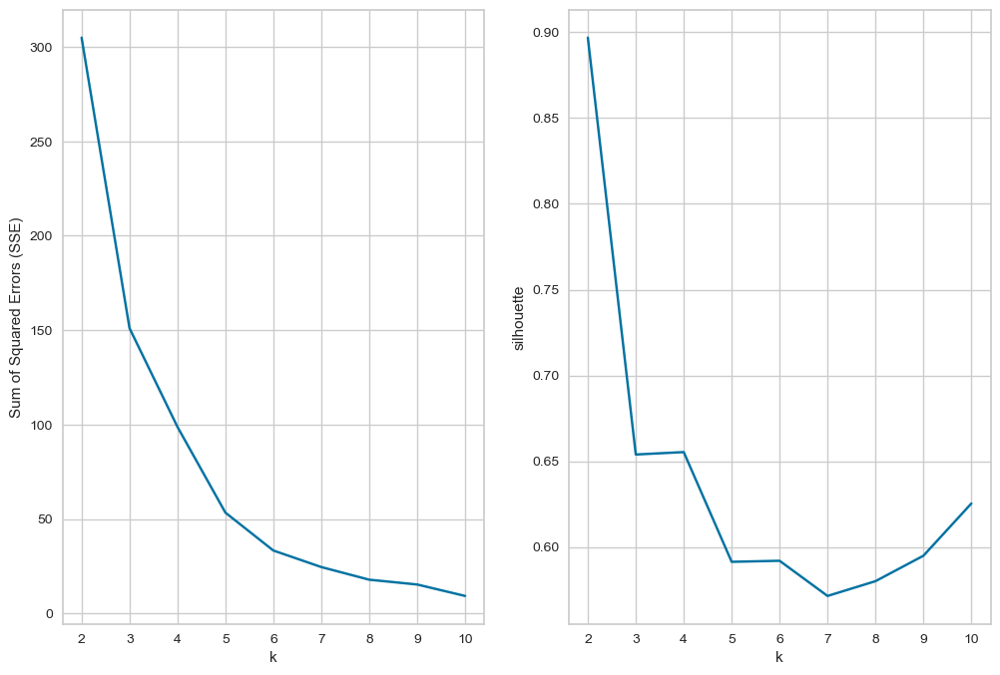

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

score = pd.DataFrame(
    {
        "k": list(range(2, 11)),
        "sse": inertia_values,
        "silhouette": silhouette_scores,
    }
)

fig, ax = plt.subplots(1, 2, figsize=(12, 8))
sns.lineplot(score, x="k", y="sse", ax=ax[0])
sns.lineplot(score, x="k", y="silhouette", ax=ax[1])
ax[0].set_ylabel("Sum of Squared Errors (SSE)")
ax[0].set_xticks(list(range(2, 11)))
plt.show()

In [271]:
len(inertia_values)

9

In [310]:
silhouette_scores = [x.mean() for x in silhouette_scores]
silhouette_scores

[0.8968590644929493,
 0.6539390918381042,
 0.6553528888917564,
 0.5914038353711485,
 0.5920173083911947,
 0.5715163960515018,
 0.5801276681513157,
 0.594954092162131,
 0.6254028207337399]

In [236]:
from yellowbrick.cluster import SilhouetteVisualizer

In [ ]:
params = {
    key: value
    for key, value in kmeans_grid_cv.best_params_.items()
    if key != "n_clusters"
}
km = KMeans(n_clusters=5, **params)

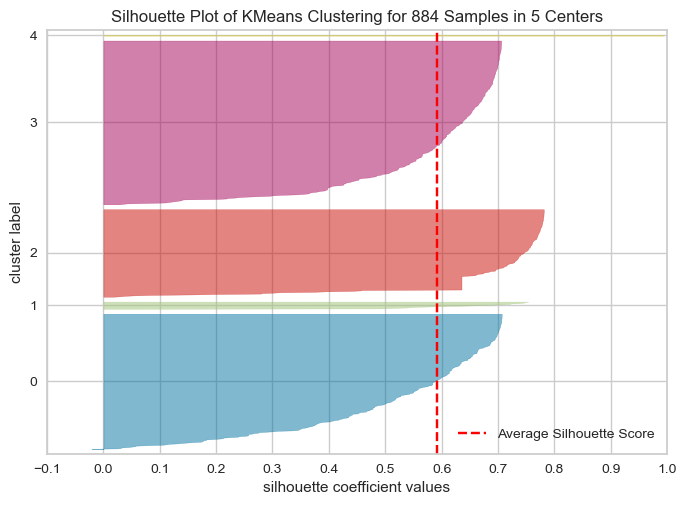

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 884 Samples in 5 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [ ]:
visualizer = SilhouetteVisualizer(km, colors="yellowbrick")
visualizer.fit(X2)
visualizer.show()

In [ ]:
import os
import sys

sys.path.append(os.path.abspath("../"))
from src.helper import show_clustered_image

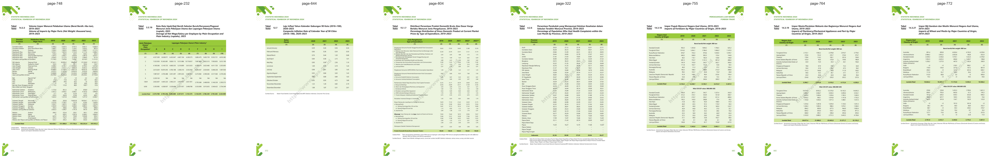

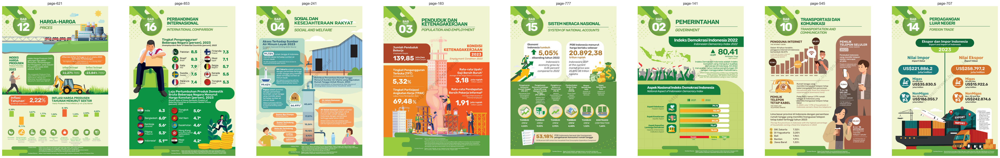

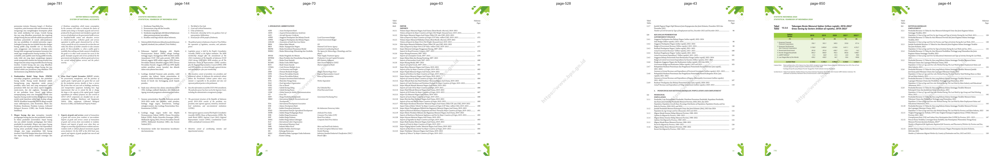

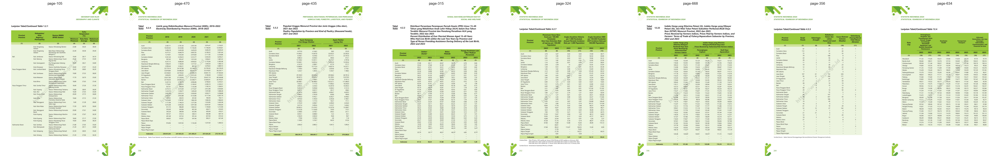

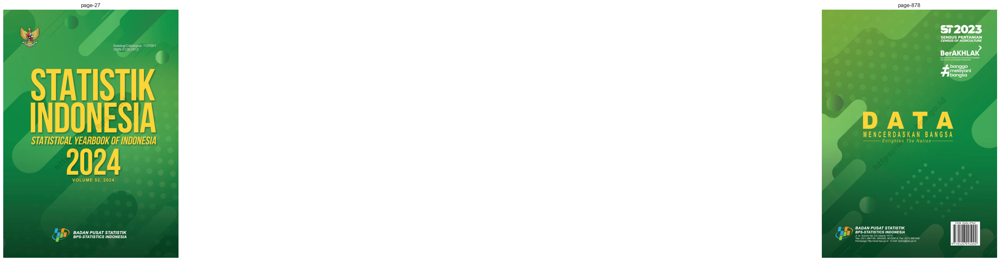

In [ ]:
df300["label"] = km.labels_
for i in range(5):
    show_clustered_image(df300, i)

In [ ]:
df300["label"].replace(4, 1, inplace=True)
df300["label"].value_counts()

/var/folders/py/8_pc5kdx5jx5nfc61_n_79dc0000gp/T/ipykernel_22156/3436502556.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df300['label'].replace(4,1, inplace=True)


label
3    366
0    303
2    196
1     19
Name: count, dtype: int64

In [467]:
df5 = pd.read_csv("../datasets/cmyk_by_dpi_and_render_options.csv")
df5.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 82212 entries, 0 to 82211
Data columns (total 11 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   converting_time      82212 non-null  float64
 1   page                 82212 non-null  int64  
 2   dpi                  82212 non-null  int64  
 3   c                    82212 non-null  float64
 4   m                    82212 non-null  float64
 5   y                    82212 non-null  float64
 6   k                    82212 non-null  float64
 7   sum                  82212 non-null  float64
 8   base_minus_curr_sum  82212 non-null  float64
 9   diff                 82212 non-null  float64
 10  options              82212 non-null  object 
dtypes: float64(8), int64(2), object(1)
memory usage: 6.9+ MB


In [ ]:
df5 = df5[(df5["options"] == "default") & (df5["dpi"] == 5)].copy()
# df5['c'] = df5['c'] * (1 + (4.5/8.5))
# df5['m'] = df5['m'] * (1 + (4.5/8.5))
# df5['y'] = df5['y'] * (1 + (4.5/8.5))
# df5['k'] = df5['k'] * (1 + (4.5/8.5))
# df5['sum'] = df5['c'] + df5['m'] + df5['y'] + df5['k']

df5

,converting_time,page,dpi,c,m,y,k,sum,base_minus_curr_sum,diff,options
26520,0.036831,1,5,0.16,0.19,0.52,8.93,9.80,-1.11,1.11,default
26521,0.156529,2,5,0.56,0.51,0.00,4.35,5.42,0.60,0.60,default
26522,0.017131,3,5,0.00,0.00,0.00,65.50,65.50,-55.29,55.29,default
26523,0.009017,4,5,0.00,0.00,0.00,75.99,75.99,-64.96,64.96,default
26524,0.009348,5,5,0.00,0.00,0.00,75.99,75.99,-64.81,64.81,default
...,...,...,...,...,...,...,...,...,...,...,...
27399,0.023905,880,5,0.00,0.00,0.00,6.24,6.24,-0.52,0.52,default
27400,0.032836,881,5,2.55,11.07,11.06,15.09,39.77,-5.30,5.30,default
27401,0.003468,882,5,0.81,1.20,1.84,1.35,5.20,-0.09,0.09,default
27402,0.016195,883,5,4.67,27.89,29.58,16.01,78.15,-7.01,7.01,default


In [ ]:
X = scaler.fit_transform(df5[["c", "m", "y", "k", "sum"]])
y = df300["label"]

print(X)
print(y)

[[-6.54703192e-01 -4.97795301e-03 -1.13551517e+00  6.90339089e-02
  -5.04417692e-01]
 [-5.49543366e-01  2.04882456e-01 -1.22862398e+00 -3.25794411e-01
  -7.79253007e-01]
 [-6.96767123e-01 -1.29582571e-01 -1.22862398e+00  4.94576711e+00
   2.99063415e+00]
 ...
 [-4.83818474e-01  6.57393964e-01 -8.99162016e-01 -5.84415581e-01
  -7.93057521e-01]
 [ 5.30973853e-01  1.81610637e+01  4.06783523e+00  6.79379870e-01
   3.78439368e+00]
 [ 2.54929308e-01  2.51990510e+00 -2.00845893e-01 -2.06828673e-01
   8.10191784e-02]]
0      2
1      2
2      0
3      0
4      0
      ..
879    2
880    3
881    2
882    1
883    3
Name: label, Length: 884, dtype: int32


In [ ]:
from sklearn.model_selection import GridSearchCV, train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((707, 5), (177, 5), (707,), (177,))

In [471]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix

In [ ]:
rfc = RandomForestClassifier(criterion="entropy")
rfc.fit(X_train, y_train)

RandomForestClassifier(criterion='entropy')

In [473]:
y_pred = rfc.predict(X_test)

In [474]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.98      0.95      0.97        61
           1       1.00      1.00      1.00         4
           2       1.00      0.97      0.99        39
           3       0.96      1.00      0.98        73

    accuracy                           0.98       177
   macro avg       0.99      0.98      0.98       177
weighted avg       0.98      0.98      0.98       177



In [475]:
print(confusion_matrix(y_test, y_pred))

[[58  0  0  3]
 [ 0  4  0  0]
 [ 1  0 38  0]
 [ 0  0  0 73]]


In [ ]:
grid_param_rfc = {
    "criterion": ["gini", "entropy", "log_loss"],
    "max_features": ["sqrt", "log2"],
}
rfc = RandomForestClassifier()

In [ ]:
rfc_grid_cv = GridSearchCV(
    rfc, param_grid=grid_param_rfc, cv=5, verbose=2, scoring="accuracy"
)
rfc_grid_cv.fit(X_train, y_train)

Fitting 5 folds for each of 6 candidates, totalling 30 fits
[CV] END ..................criterion=gini, max_features=sqrt; total time=   0.2s
[CV] END ..................criterion=gini, max_features=sqrt; total time=   0.2s
[CV] END ..................criterion=gini, max_features=sqrt; total time=   0.2s
[CV] END ..................criterion=gini, max_features=sqrt; total time=   0.2s
[CV] END ..................criterion=gini, max_features=sqrt; total time=   0.2s
[CV] END ..................criterion=gini, max_features=log2; total time=   0.2s
[CV] END ..................criterion=gini, max_features=log2; total time=   0.2s
[CV] END ..................criterion=gini, max_features=log2; total time=   0.2s
[CV] END ..................criterion=gini, max_features=log2; total time=   0.2s
[CV] END ..................criterion=gini, max_features=log2; total time=   0.2s
[CV] END ...............criterion=entropy, max_features=sqrt; total time=   0.2s
[CV] END ...............criterion=entropy, max_fe

GridSearchCV(cv=5, estimator=RandomForestClassifier(),
             param_grid={'criterion': ['gini', 'entropy', 'log_loss'],
                         'max_features': ['sqrt', 'log2']},
             scoring='accuracy', verbose=2)

In [476]:
print(rfc_grid_cv.best_score_)
print(rfc_grid_cv.best_params_)


0.9830386574767755
{'criterion': 'gini', 'max_features': 'sqrt'}


In [436]:
rfc = RandomForestClassifier(**rfc_grid_cv.best_params_)

In [437]:
rfc.fit(X_train, y_train)
y_pred = rfc.predict(X_test)

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.98      0.95      0.97        61
           1       1.00      1.00      1.00         4
           2       1.00      1.00      1.00        39
           3       0.96      0.99      0.97        73

    accuracy                           0.98       177
   macro avg       0.99      0.98      0.98       177
weighted avg       0.98      0.98      0.98       177



In [438]:
print(confusion_matrix(y_test, y_pred))

[[58  0  0  3]
 [ 0  4  0  0]
 [ 0  0 39  0]
 [ 1  0  0 72]]


In [457]:
from sklearn.ensemble import AdaBoostClassifier

In [ ]:
abc = AdaBoostClassifier()
dtc = DecisionTreeClassifier(class_weight="balanced")

In [ ]:
abc.fit(X_train, y_train)
dtc.fit(
    X_train,
    y_train,
)
y_pred = abc.predict(X_test)

print(classification_report(y_pred, y_test))

              precision    recall  f1-score   support

           0       0.98      0.94      0.96        64
           1       0.75      1.00      0.86         3
           2       1.00      1.00      1.00        39
           3       0.95      0.97      0.96        71

    accuracy                           0.97       177
   macro avg       0.92      0.98      0.94       177
weighted avg       0.97      0.97      0.97       177



In [465]:
y_pred = dtc.predict(X_test)

print(classification_report(y_pred, y_test))

              precision    recall  f1-score   support

           0       0.98      0.97      0.98        62
           1       0.75      1.00      0.86         3
           2       1.00      1.00      1.00        39
           3       0.97      0.97      0.97        73

    accuracy                           0.98       177
   macro avg       0.93      0.99      0.95       177
weighted avg       0.98      0.98      0.98       177



In [3]:
import matplotlib.pyplot as plt

In [6]:
!conda activate print-cost


CondaError: Run 'conda init' before 'conda activate'



In [ ]:
import jcopml

pd.read_csv("../datasets/")

## Hello World

In [1]:
import pandas as pd

In [20]:
df = pd.read_csv("../outputs/csv/cmyk_of_a_pdf_file_by_dpi.csv")
print(df.shape)
df.sample(20)

(50388, 10)


,library,dpi,converting_time,page,c,m,y,k,cmy,cmyk
14018,pdf2image,6,0.000339,759,3.14,0.13,9.18,4.33,12.45,16.78
32020,pdf2image,40,0.007142,197,3.37,0.05,9.08,5.90,12.50,18.40
36096,pymupdf,50,0.026079,737,2.58,0.04,7.58,5.38,10.20,15.58
25530,pymupdf,10,0.018499,779,0.32,0.11,0.81,4.67,1.24,5.91
14993,pymupdf,6,0.005596,850,1.29,0.01,3.65,2.66,4.95,7.61
37329,pdf2image,100,0.089276,202,6.55,0.03,17.10,7.66,23.68,31.34
30572,pymupdf,30,0.011983,517,3.01,0.03,8.51,6.00,11.55,17.55
894,pymupdf,1,0.001932,11,0.00,0.00,0.00,24.39,0.00,24.39
49436,pymupdf,300,0.937972,817,2.10,0.10,5.90,3.95,8.10,12.05
11720,pymupdf,5,0.007773,229,1.76,0.00,5.26,3.80,7.02,10.82


In [21]:
df = df[(df.library == 'pymupdf') & (df.dpi==300)]
df

,library,dpi,converting_time,page,c,m,y,k,cmy,cmyk
48620,pymupdf,300,1.845553,1,0.18,0.18,0.39,7.88,0.75,8.63
48621,pymupdf,300,1.943345,2,1.39,1.07,0.02,3.63,2.48,6.11
48622,pymupdf,300,1.911917,3,0.00,0.00,0.00,9.55,0.00,9.55
48623,pymupdf,300,1.710605,4,0.00,0.00,0.00,10.28,0.00,10.28
48624,pymupdf,300,1.719655,5,0.00,0.00,0.00,10.43,0.00,10.43
...,...,...,...,...,...,...,...,...,...,...
49499,pymupdf,300,1.432159,880,0.00,0.00,0.00,5.56,0.00,5.56
49500,pymupdf,300,1.535016,881,1.01,10.35,11.62,11.30,22.98,34.28
49501,pymupdf,300,1.333026,882,0.80,1.27,1.81,1.49,3.88,5.37
49502,pymupdf,300,1.275315,883,2.40,26.71,30.15,11.87,59.26,71.13


<Axes: >

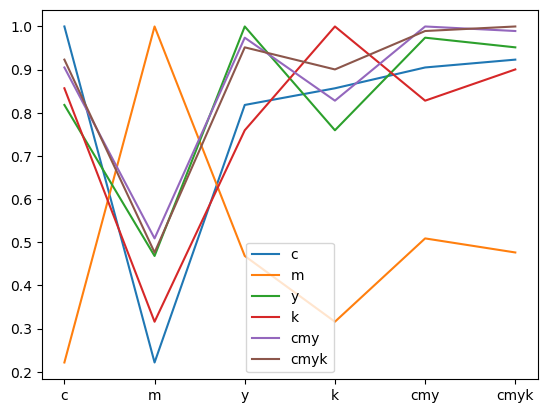

In [ ]:
df[['c', 'm', 'y', 'k', 'cmy', 'cmyk']].corr()

<Axes: >

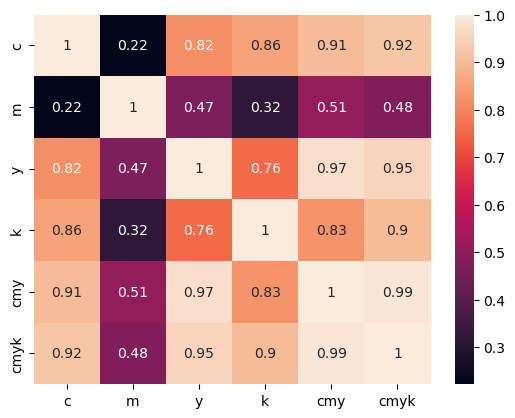

In [26]:
import seaborn as sns
sns.heatmap(df[['c', 'm', 'y', 'k', 'cmy', 'cmyk']].corr(), annot=True)

In [33]:
df = pd.read_csv("../outputs/csv/cv_results_xgboost_1-100dpi_and_feature_tuning.csv")

cv_result_cleaned = df.drop_duplicates(
    ["best_score_cv", "testing_score", "dpi", "converting_time", "features"]
)
cv_result_cleaned.sort_values(
    by=["testing_score", "converting_time"],
    ascending=[False, True],
)[
    [
        "training_score",
        "testing_score",
        "dpi",
        "best_score_cv",
        "converting_time",
        "features",
    ]
]

,training_score,testing_score,dpi,best_score_cv,converting_time,features
510,1.000000,1.000000,40.0,0.984039,17.452735,"['cmy', 'k', 'cmyk']"
270,1.000000,0.993181,7.0,0.979339,8.131164,"['cmy', 'k', 'cmyk']"
380,1.000000,0.993151,10.0,0.975141,9.134181,"['c', 'm', 'y', 'k', 'cmyk']"
460,1.000000,0.993115,30.0,0.988141,12.581692,"['c', 'm', 'y', 'k', 'cmyk']"
500,1.000000,0.993111,40.0,0.989744,17.452735,"['c', 'm', 'y', 'k', 'cmyk']"
430,0.998309,0.989996,20.0,0.979481,10.254706,"['cmy', 'k', 'cmyk']"
420,0.998309,0.989718,20.0,0.986201,10.254706,"['c', 'm', 'y', 'k', 'cmyk']"
540,1.000000,0.989713,50.0,0.988043,24.475727,"['c', 'm', 'y', 'k', 'cmyk']"
590,0.998309,0.989548,100.0,0.984813,98.536494,"['cmy', 'k', 'cmyk']"
320,0.986470,0.989318,9.0,0.972134,7.832357,"['cmy', 'k']"


In [30]:
cv_result_cleaned

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_algo__objective,param_algo__max_depth,param_algo__learning_rate,param_algo__gamma,params,split0_test_score,...,mean_test_score,std_test_score,rank_test_score,features,dpi,training_score,best_score_cv,testing_score,split4_test_score,converting_time
0,0.435137,0.086445,0.006987,0.000277,multi:softmax,45,0.050,0.016327,"{'algo__objective': 'multi:softmax', 'algo__ma...",0.853864,...,0.849008,0.033419,6.0,"['cmy', 'k']",1.0,0.928682,0.860025,0.878381,0.868255,9.124531
10,0.377481,0.118498,0.008194,0.000206,multi:softprob,5,0.010,0.212245,"{'algo__objective': 'multi:softprob', 'algo__m...",0.857579,...,0.891326,0.026069,7.0,"['c', 'm', 'y', 'cmyk']",1.0,0.964766,0.900882,0.868732,0.932127,9.124531
20,0.211814,0.016648,0.008593,0.001067,multi:softprob,60,0.100,0.391837,"{'algo__objective': 'multi:softprob', 'algo__m...",0.858469,...,0.876650,0.018392,3.0,"['c', 'm', 'y', 'k', 'cmyk']",1.0,0.971343,0.877061,0.878356,0.854841,9.124531
30,0.214626,0.011219,0.008296,0.000720,multi:softmax,45,0.100,0.669388,"{'algo__objective': 'multi:softmax', 'algo__ma...",0.867963,...,0.853880,0.017138,3.0,"['cmy', 'k', 'cmyk']",1.0,0.895124,0.859244,0.888380,0.857563,9.124531
40,0.346365,0.015799,0.006925,0.000472,multi:softprob,45,0.050,0.212245,"{'algo__objective': 'multi:softprob', 'algo__m...",0.876778,...,0.906114,0.024090,6.0,"['cmy', 'k']",2.0,0.959838,0.914884,0.921872,0.883269,7.216622
50,0.259363,0.027154,0.008745,0.000753,multi:softmax,50,0.100,0.391837,"{'algo__objective': 'multi:softmax', 'algo__ma...",0.907369,...,0.900553,0.016834,2.0,"['c', 'm', 'y', 'cmyk']",2.0,0.984843,0.900639,0.907740,0.910654,7.216622
60,0.709144,0.403429,0.011671,0.005292,multi:softprob,45,0.050,0.277551,"{'algo__objective': 'multi:softprob', 'algo__m...",0.918190,...,0.911273,0.020803,9.0,"['c', 'm', 'y', 'k', 'cmyk']",2.0,0.971541,0.917961,0.885424,0.898827,7.216622
70,0.424998,0.093537,0.039633,0.059438,multi:softprob,10,0.001,0.310204,"{'algo__objective': 'multi:softprob', 'algo__m...",0.895877,...,0.909486,0.012527,3.0,"['cmy', 'k', 'cmyk']",2.0,0.942759,0.911321,0.917808,0.922085,7.216622
80,0.279812,0.015210,0.007459,0.000272,multi:softprob,60,0.050,0.555102,"{'algo__objective': 'multi:softprob', 'algo__m...",0.941057,...,0.953194,0.008629,2.0,"['cmy', 'k']",3.0,0.978253,0.956401,0.976473,0.958770,9.191975
90,0.249362,0.023870,0.008277,0.000760,multi:softmax,5,0.100,0.261224,"{'algo__objective': 'multi:softmax', 'algo__ma...",0.933631,...,0.947579,0.013786,1.0,"['c', 'm', 'y', 'cmyk']",3.0,0.989893,0.947579,0.937528,0.930739,9.191975


In [35]:
df = pd.read_csv("../outputs/csv/cmyk_of_a_pdf_file_by_dpi.csv")
df.sample(10)

,library,dpi,converting_time,page,c,m,y,k,cmy,cmyk
9646,pymupdf,4,0.004034,807,1.22,0.02,3.41,2.72,4.65,7.37
26439,pdfium,10,0.007915,804,2.51,0.03,6.96,6.37,9.50,15.87
3956,pymupdf,2,0.006971,421,2.84,0.00,7.98,5.23,10.82,16.05
10240,pdfium,4,0.004610,517,2.88,0.03,7.82,6.21,10.73,16.94
27993,pymupdf,20,0.008979,590,1.50,0.01,4.18,3.36,5.69,9.05
9519,pymupdf,4,0.000772,680,0.00,0.00,0.00,0.05,0.00,0.05
3665,pymupdf,2,0.004257,130,3.74,0.00,10.73,5.01,14.47,19.48
4189,pymupdf,2,0.003732,654,1.37,0.00,3.83,1.96,5.20,7.16
34423,pdfium,40,0.011518,832,2.08,0.03,6.03,4.06,8.14,12.20
6783,pymupdf,3,0.005761,596,2.17,0.01,6.24,4.50,8.42,12.92
